In [1]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image
import glob
import random

# Device setup
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"Using device: {device}")

if device.type == "cuda":
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True

np.random.seed(3)

Using device: cuda


In [2]:
def show_mask(mask, ax, random_color=False, borders=True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask = mask.astype(np.uint8)
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    if borders:
        import cv2
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
        mask_image = cv2.drawContours(mask_image, contours, -1, (1, 1, 1, 0.5), thickness=2)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

In [3]:
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

# Load SAM2 model
sam2_checkpoint = "sam_checkpoints/sam2.1_hiera_large.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

sam2_model = build_sam2(model_cfg, sam2_checkpoint, device=device)
predictor = SAM2ImagePredictor(sam2_model)

print("SAM2 model loaded successfully!")

SAM2 model loaded successfully!


In [4]:
def load_dataset(data_dir):
    """Load dataset from all country directories"""
    dataset = []
    country_dirs = [d for d in os.listdir(data_dir) if d.startswith('country_')]
    
    for country_dir in country_dirs:
        country_path = os.path.join(data_dir, country_dir)
        images_path = os.path.join(country_path, 'images')
        labels_path = os.path.join(country_path, 'labels')
        
        image_files = glob.glob(os.path.join(images_path, '*.jpg'))
        
        for image_file in image_files:
            base_name = os.path.splitext(os.path.basename(image_file))[0]
            label_file = os.path.join(labels_path, f"{base_name}.txt")
            
            if os.path.exists(label_file):
                bboxes = []
                with open(label_file, 'r') as f:
                    for line in f:
                        line = line.strip()
                        if line:
                            parts = line.split()
                            if len(parts) == 5:
                                class_id = int(parts[0])
                                x_center = float(parts[1])
                                y_center = float(parts[2])
                                width = float(parts[3])
                                height = float(parts[4])
                                bboxes.append({
                                    'class_id': class_id,
                                    'x_center': x_center,
                                    'y_center': y_center,
                                    'width': width,
                                    'height': height,
                                })
                
                dataset.append({
                    'image_path': image_file,
                    'label_path': label_file,
                    'bboxes': bboxes,
                    'country': country_dir
                })
    
    return dataset

# Load dataset
data_dir = "data"
dataset = load_dataset(data_dir)
samples_with_bboxes = [sample for sample in dataset if len(sample['bboxes']) > 0]

print(f"Total samples: {len(dataset)}")
print(f"Samples with bounding boxes: {len(samples_with_bboxes)}")

Total samples: 6039
Samples with bounding boxes: 6039


In [5]:
import cv2
from sklearn.cluster import KMeans

def analyze_road_region(image):
    """
    Analyze the bottom portion of the image to find optimal segmentation points
    """
    h, w = image.shape[:2]
    
    # Focus on bottom 60% of the image where road is typically located
    bottom_region = image[int(h * 0.4):, :]
    bottom_h, bottom_w = bottom_region.shape[:2]
    
    # Convert to grayscale for analysis
    gray = cv2.cvtColor(bottom_region, cv2.COLOR_RGB2GRAY)
    
    # Apply Gaussian blur to reduce noise
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # Edge detection to find road boundaries
    edges = cv2.Canny(blurred, 50, 150)
    
    # Calculate horizontal gradient to identify road surface
    grad_x = cv2.Sobel(blurred, cv2.CV_64F, 1, 0, ksize=3)
    grad_y = cv2.Sobel(blurred, cv2.CV_64F, 0, 1, ksize=3)
    magnitude = np.sqrt(grad_x**2 + grad_y**2)
    
    # Find areas with low gradient (smooth road surface)
    smooth_areas = magnitude < np.percentile(magnitude, 30)
    
    return bottom_region, edges, smooth_areas, int(h * 0.4)

def find_dynamic_points(image, n_positive=3, n_negative=2):
    """
    Dynamically find optimal segmentation points based on image analysis
    """
    h, w = image.shape[:2]
    
    # Analyze the road region
    bottom_region, edges, smooth_areas, y_offset = analyze_road_region(image)
    bottom_h, bottom_w = bottom_region.shape[:2]
    
    # Find positive points (road surface)
    positive_points = []
    
    # Strategy 1: Find smooth areas in the bottom portion
    smooth_coords = np.where(smooth_areas)
    if len(smooth_coords[0]) > 0:
        # Sample points from smooth areas
        indices = np.random.choice(len(smooth_coords[0]), 
                                 min(n_positive * 3, len(smooth_coords[0])), 
                                 replace=False)
        
        for idx in indices:
            y_local = smooth_coords[0][idx]
            x_local = smooth_coords[1][idx]
            
            # Convert back to full image coordinates
            y_global = y_local + y_offset
            x_global = x_local
            
            # Prefer points in lower portion and center-ish area
            if (y_global > h * 0.6 and 
                x_global > w * 0.2 and 
                x_global < w * 0.8 and
                len(positive_points) < n_positive):
                positive_points.append([x_global, y_global])
    
    # Strategy 2: Add strategic points if we don't have enough
    while len(positive_points) < n_positive:
        # Add points in different horizontal positions of the lower road area
        for frac in [0.3, 0.5, 0.7]:
            if len(positive_points) >= n_positive:
                break
            x = int(w * frac)
            y = int(h * 0.8)  # Lower portion
            positive_points.append([x, y])
    
    # Find negative points (non-road areas)
    negative_points = []
    
    # Strategy: Points in upper portion (sky/buildings) and extreme edges
    negative_candidates = [
        [w // 2, int(h * 0.1)],  # Top center (likely sky)
        [int(w * 0.1), int(h * 0.3)],  # Upper left
        [int(w * 0.9), int(h * 0.3)],  # Upper right
        [0, h // 2],  # Left edge
        [w - 1, h // 2],  # Right edge
    ]
    
    # Select the best negative points
    for point in negative_candidates:
        if len(negative_points) < n_negative:
            negative_points.append(point)
    
    # Combine points and labels
    all_points = positive_points + negative_points
    all_labels = [1] * len(positive_points) + [0] * len(negative_points)
    
    return np.array(all_points), np.array(all_labels)

def segment_road_image_dynamic(image_path, predictor):
    """
    Apply SAM segmentation with dynamic point selection optimized for road images
    """
    # Load image
    image = Image.open(image_path)
    image = np.array(image.convert("RGB"))
    
    # Set image for predictor
    predictor.set_image(image)
    
    # Get dynamic points
    input_points, input_labels = find_dynamic_points(image)
    
    # Get predictions with multiple points
    masks, scores, logits = predictor.predict(
        point_coords=input_points,
        point_labels=input_labels,
        multimask_output=True,
    )
    
    # Sort by score (highest first)
    sorted_ind = np.argsort(scores)[::-1]
    masks = masks[sorted_ind]
    scores = scores[sorted_ind]
    
    return image, masks, scores, input_points, input_labels

def segment_road_image(image_path, predictor):
    """
    Apply SAM segmentation to road image with optimized point selection
    Point is placed at 5/8 height from top and 1/2 width from left (road center)
    """
    # Load image
    image = Image.open(image_path)
    image = np.array(image.convert("RGB"))
    
    # Set image for predictor
    predictor.set_image(image)
    
    # Get image dimensions
    h, w = image.shape[:2]
    
    # Modified point selection: 5/8 from top, 1/2 from left
    input_point = np.array([[w // 2, int(h * 7/8)]])
    input_label = np.array([1])
    
    # Get predictions
    masks, scores, logits = predictor.predict(
        point_coords=input_point,
        point_labels=input_label,
        multimask_output=True,
    )
    
    # Sort by score (highest first)
    sorted_ind = np.argsort(scores)[::-1]
    masks = masks[sorted_ind]
    scores = scores[sorted_ind]
    
    return image, masks, scores, input_point, input_label

def plot_best_segmentation(image, masks, scores, input_point, input_label, sample_info):
    """Plot original image and the most confident segmentation result"""
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))
    
    # Original image with point
    axes[0].imshow(image)
    show_points(input_point, input_label, axes[0])
    axes[0].set_title(f"Original Image\n{os.path.basename(sample_info['image_path'])}")
    axes[0].axis('off')
    
    # Best segmentation mask
    axes[1].imshow(image)
    show_mask(masks[0], axes[1], borders=True)
    show_points(input_point, input_label, axes[1])
    axes[1].set_title(f"Best Segmentation\nConfidence: {scores[0]:.3f}")
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return scores[0]  # Return confidence score

Processing road segmentation on sample images...

Sample 1/5: country1_009071.jpg
Country: country_1, Damage instances: 2


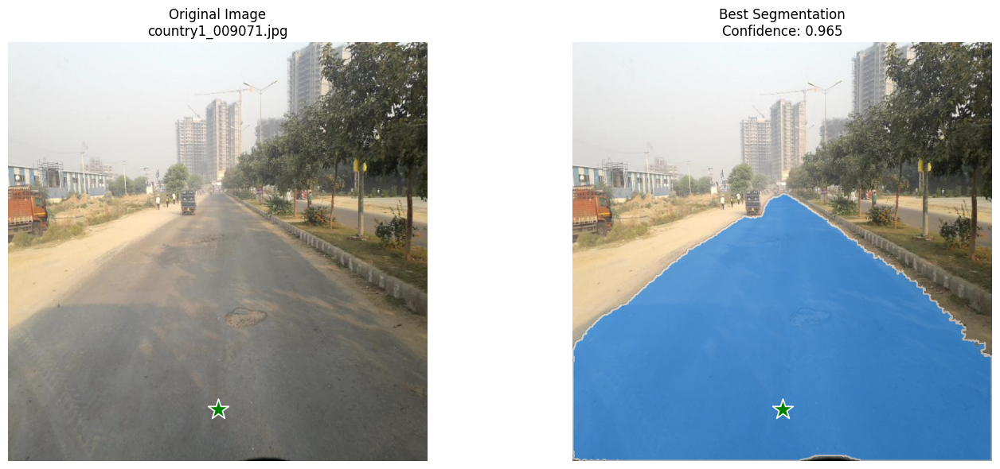

Segmentation confidence: 0.965

Sample 2/5: country3_002362.jpg
Country: country_3, Damage instances: 2


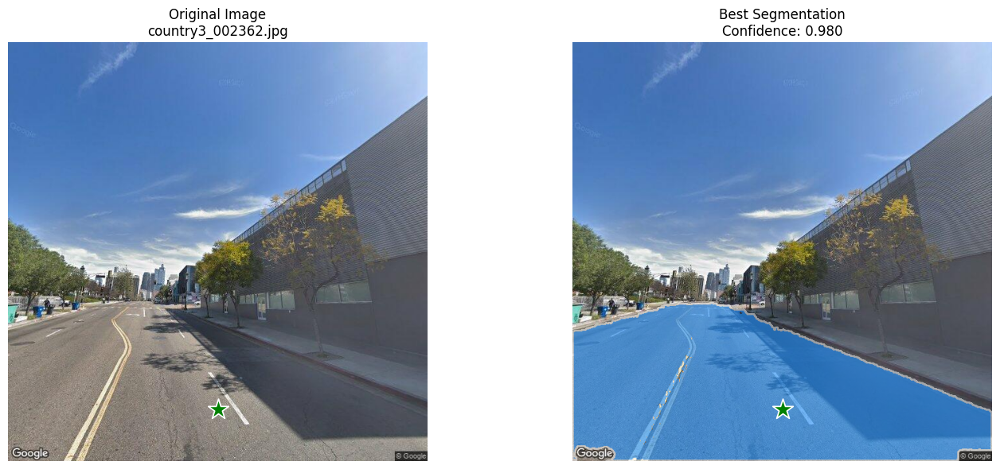

Segmentation confidence: 0.980

Sample 3/5: country2_012691.jpg
Country: country_2, Damage instances: 3


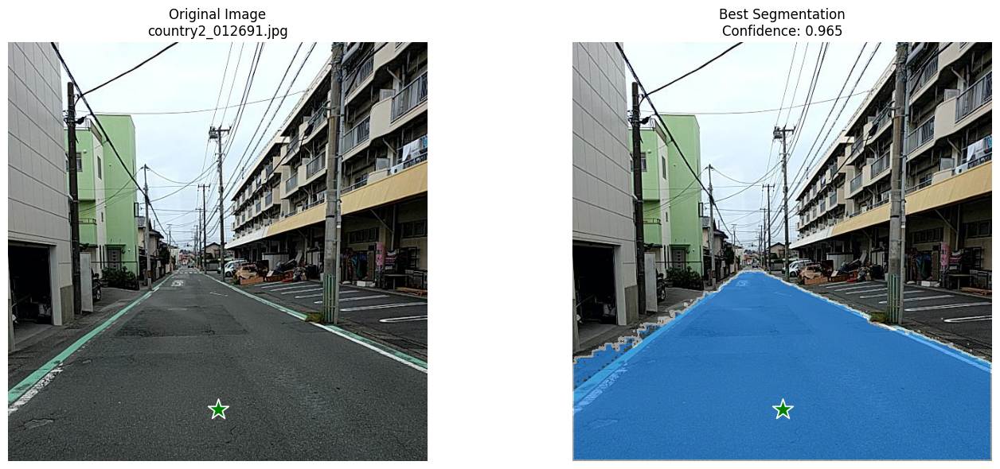

Segmentation confidence: 0.965

Sample 4/5: country1_000535.jpg
Country: country_1, Damage instances: 1


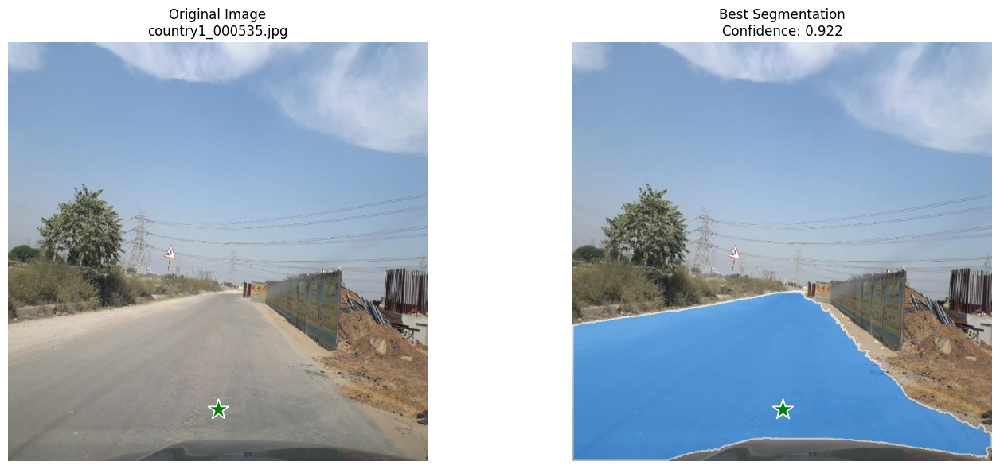

Segmentation confidence: 0.922

Sample 5/5: country1_007474.jpg
Country: country_1, Damage instances: 5


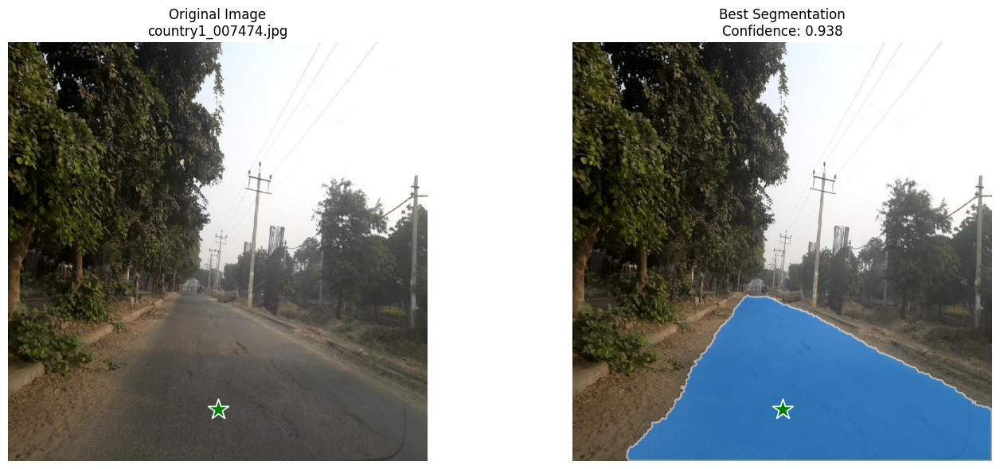

Segmentation confidence: 0.938

Average segmentation confidence: 0.954
Confidence range: 0.922 - 0.980


In [6]:
# Sample and process images
n_samples = 5
random_samples = random.sample(samples_with_bboxes, min(n_samples, len(samples_with_bboxes)))

print("Processing road segmentation on sample images...")
print("=" * 60)

confidence_scores = []

for i, sample in enumerate(random_samples):
    print(f"\nSample {i+1}/{len(random_samples)}: {os.path.basename(sample['image_path'])}")
    print(f"Country: {sample['country']}, Damage instances: {len(sample['bboxes'])}")
    
    try:
        # Apply segmentation
        image, masks, scores, input_point, input_label = segment_road_image(
            sample['image_path'], predictor
        )
        
        # Plot results
        confidence = plot_best_segmentation(image, masks, scores, input_point, input_label, sample)
        confidence_scores.append(confidence)
        
        print(f"Segmentation confidence: {confidence:.3f}")
        
    except Exception as e:
        print(f"Error processing {sample['image_path']}: {e}")

print(f"\nAverage segmentation confidence: {np.mean(confidence_scores):.3f}")
print(f"Confidence range: {np.min(confidence_scores):.3f} - {np.max(confidence_scores):.3f}")

In [7]:
def compare_segmentation_methods(sample, predictor):
    """
    Compare fixed point vs dynamic point segmentation on a single image
    """
    print(f"Comparing segmentation methods for: {os.path.basename(sample['image_path'])}")
    
    # Fixed point segmentation
    image_fixed, masks_fixed, scores_fixed, points_fixed, labels_fixed = segment_road_image(
        sample['image_path'], predictor
    )
    
    # Dynamic point segmentation  
    image_dynamic, masks_dynamic, scores_dynamic, points_dynamic, labels_dynamic = segment_road_image_dynamic(
        sample['image_path'], predictor
    )
    
    # Create comparison plot
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    
    # Row 1: Fixed point method
    axes[0, 0].imshow(image_fixed)
    show_points(points_fixed, labels_fixed, axes[0, 0])
    axes[0, 0].set_title(f"Fixed Point Method\n{len(points_fixed)} points")
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(image_fixed)
    show_mask(masks_fixed[0], axes[0, 1], borders=True)
    show_points(points_fixed, labels_fixed, axes[0, 1])
    axes[0, 1].set_title(f"Fixed Segmentation\nConfidence: {scores_fixed[0]:.3f}")
    axes[0, 1].axis('off')
    
    axes[0, 2].imshow(masks_fixed[0], cmap='gray')
    axes[0, 2].set_title("Fixed Mask Only")
    axes[0, 2].axis('off')
    
    # Row 2: Dynamic point method
    axes[1, 0].imshow(image_dynamic)
    show_points(points_dynamic, labels_dynamic, axes[1, 0])
    axes[1, 0].set_title(f"Dynamic Point Method\n{len(points_dynamic)} points")
    axes[1, 0].axis('off')
    
    axes[1, 1].imshow(image_dynamic)
    show_mask(masks_dynamic[0], axes[1, 1], borders=True)
    show_points(points_dynamic, labels_dynamic, axes[1, 1])
    axes[1, 1].set_title(f"Dynamic Segmentation\nConfidence: {scores_dynamic[0]:.3f}")
    axes[1, 1].axis('off')
    
    axes[1, 2].imshow(masks_dynamic[0], cmap='gray')
    axes[1, 2].set_title("Dynamic Mask Only")
    axes[1, 2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Calculate mask quality metrics
    fixed_mask_area = np.sum(masks_fixed[0])
    dynamic_mask_area = np.sum(masks_dynamic[0])
    
    print(f"Results comparison:")
    print(f"  Fixed method   - Confidence: {scores_fixed[0]:.3f}, Mask area: {fixed_mask_area:,} pixels")
    print(f"  Dynamic method - Confidence: {scores_dynamic[0]:.3f}, Mask area: {dynamic_mask_area:,} pixels")
    print(f"  Confidence improvement: {scores_dynamic[0] - scores_fixed[0]:+.3f}")
    
    return {
        'fixed_confidence': scores_fixed[0],
        'dynamic_confidence': scores_dynamic[0],
        'fixed_mask_area': fixed_mask_area,
        'dynamic_mask_area': dynamic_mask_area
    }

Testing Dynamic Road Segmentation

Test Sample 1/3
Image: country3_004796.jpg
Country: country_3
Damage instances: 3
Comparing segmentation methods for: country3_004796.jpg


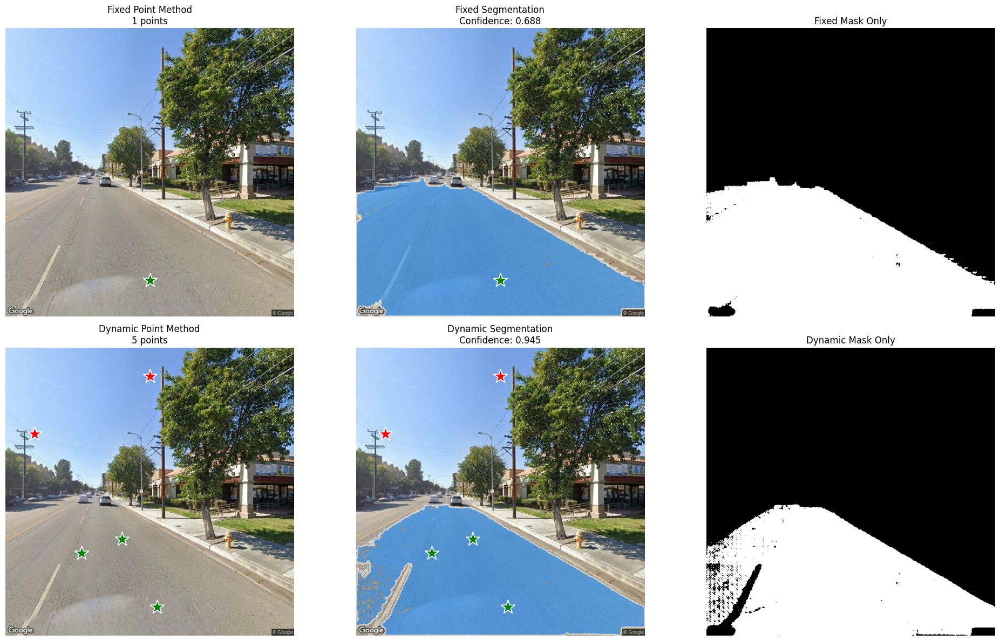

Results comparison:
  Fixed method   - Confidence: 0.688, Mask area: 140,174.0 pixels
  Dynamic method - Confidence: 0.945, Mask area: 124,923.0 pixels
  Confidence improvement: +0.258

Test Sample 2/3
Image: country1_008698.jpg
Country: country_1
Damage instances: 2
Comparing segmentation methods for: country1_008698.jpg


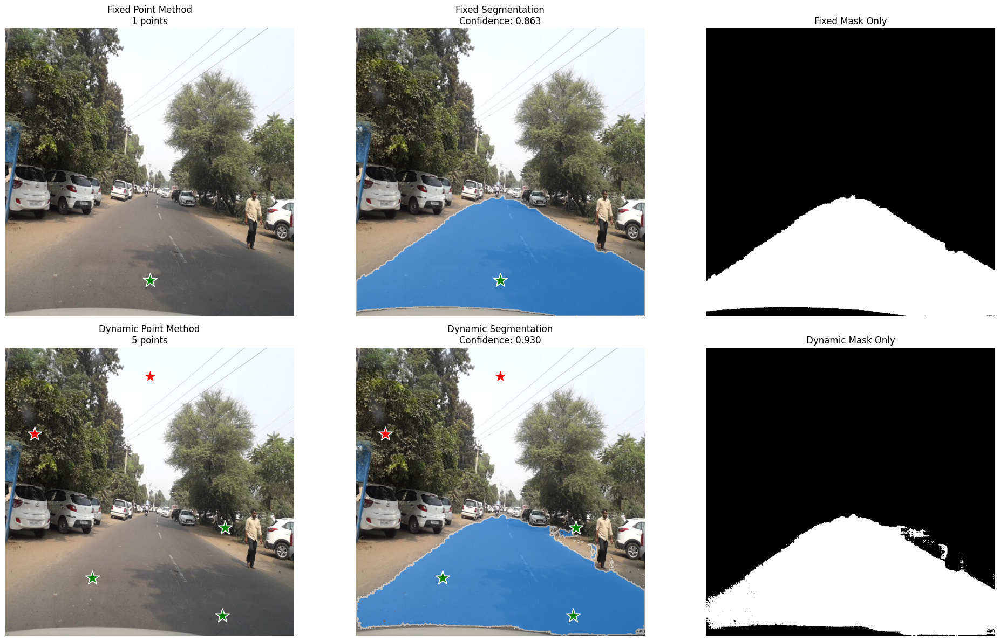

Results comparison:
  Fixed method   - Confidence: 0.863, Mask area: 141,336.0 pixels
  Dynamic method - Confidence: 0.930, Mask area: 141,214.0 pixels
  Confidence improvement: +0.066

Test Sample 3/3
Image: country1_005807.jpg
Country: country_1
Damage instances: 1
Comparing segmentation methods for: country1_005807.jpg


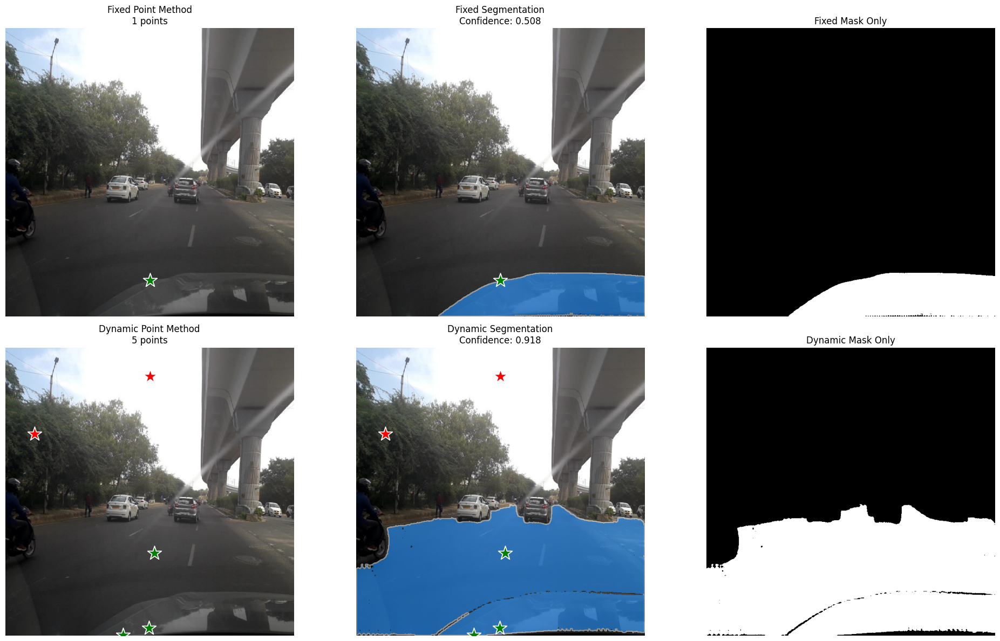

Results comparison:
  Fixed method   - Confidence: 0.508, Mask area: 45,591.0 pixels
  Dynamic method - Confidence: 0.918, Mask area: 196,269.0 pixels
  Confidence improvement: +0.410

SUMMARY STATISTICS
Average Fixed Confidence:    0.686 ± 0.145
Average Dynamic Confidence:  0.931 ± 0.011
Average Improvement:         +0.245
Improvement Range:           +0.066 to +0.410
Samples with Improvement:    3/3
Success Rate:                100.0%


In [8]:
# Test dynamic segmentation on sample images
print("Testing Dynamic Road Segmentation")
print("=" * 50)

# Select a few test samples
n_test_samples = 3
test_samples = random.sample(samples_with_bboxes, min(n_test_samples, len(samples_with_bboxes)))

comparison_results = []

for i, sample in enumerate(test_samples):
    print(f"\n{'='*60}")
    print(f"Test Sample {i+1}/{len(test_samples)}")
    print(f"Image: {os.path.basename(sample['image_path'])}")
    print(f"Country: {sample['country']}")
    print(f"Damage instances: {len(sample['bboxes'])}")
    print('='*60)
    
    try:
        # Compare both methods
        result = compare_segmentation_methods(sample, predictor)
        comparison_results.append(result)
        
    except Exception as e:
        print(f"Error processing {sample['image_path']}: {e}")

# Summary statistics
if comparison_results:
    print(f"\n{'='*60}")
    print("SUMMARY STATISTICS")
    print('='*60)
    
    fixed_confidences = [r['fixed_confidence'] for r in comparison_results]
    dynamic_confidences = [r['dynamic_confidence'] for r in comparison_results]
    improvements = [d - f for d, f in zip(dynamic_confidences, fixed_confidences)]
    
    print(f"Average Fixed Confidence:    {np.mean(fixed_confidences):.3f} ± {np.std(fixed_confidences):.3f}")
    print(f"Average Dynamic Confidence:  {np.mean(dynamic_confidences):.3f} ± {np.std(dynamic_confidences):.3f}")
    print(f"Average Improvement:         {np.mean(improvements):+.3f}")
    print(f"Improvement Range:           {np.min(improvements):+.3f} to {np.max(improvements):+.3f}")
    print(f"Samples with Improvement:    {sum(1 for imp in improvements if imp > 0)}/{len(improvements)}")
    print(f"Success Rate:                {(sum(1 for imp in improvements if imp > 0)/len(improvements)*100):.1f}%")

In [9]:
def advanced_road_segmentation(image_path, predictor, strategy='adaptive', visualize_analysis=False):
    """
    Advanced road segmentation with multiple strategies for point selection
    
    Args:
        image_path: Path to the image
        predictor: SAM2 predictor
        strategy: 'adaptive', 'grid', 'edge_based', or 'gradient_based'
        visualize_analysis: Whether to show analysis steps
    """
    # Load image
    image = Image.open(image_path)
    image = np.array(image.convert("RGB"))
    predictor.set_image(image)
    
    h, w = image.shape[:2]
    
    if strategy == 'adaptive':
        # Adaptive strategy: analyze image characteristics
        input_points, input_labels = find_dynamic_points(image)
        
    elif strategy == 'grid':
        # Grid-based strategy: systematic coverage of road area
        input_points = []
        input_labels = []
        
        # Positive points in road area (bottom 40% of image)
        road_start_y = int(h * 0.6)
        for y_frac in [0.7, 0.8, 0.9]:
            for x_frac in [0.25, 0.5, 0.75]:
                input_points.append([int(w * x_frac), int(h * y_frac)])
                input_labels.append(1)
        
        # Negative points in sky/building area
        for x_frac in [0.1, 0.5, 0.9]:
            input_points.append([int(w * x_frac), int(h * 0.1)])
            input_labels.append(0)
            
        input_points = np.array(input_points)
        input_labels = np.array(input_labels)
        
    elif strategy == 'edge_based':
        # Edge-based strategy: use edge detection to guide point placement
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        edges = cv2.Canny(gray, 50, 150)
        
        # Find road boundaries (edges in lower part)
        lower_edges = edges[int(h*0.5):, :]
        edge_coords = np.where(lower_edges > 0)
        
        input_points = []
        input_labels = []
        
        # Sample points away from edges (smooth road areas)
        if len(edge_coords[0]) > 0:
            # Create distance transform from edges
            dist_transform = cv2.distanceTransform(255 - lower_edges, cv2.DIST_L2, 5)
            
            # Find points with high distance (far from edges)
            max_dist_coords = np.where(dist_transform > np.percentile(dist_transform, 90))
            
            if len(max_dist_coords[0]) > 0:
                # Sample a few high-distance points
                sample_indices = np.random.choice(len(max_dist_coords[0]), 
                                                min(3, len(max_dist_coords[0])), 
                                                replace=False)
                for idx in sample_indices:
                    y_local = max_dist_coords[0][idx]
                    x_local = max_dist_coords[1][idx]
                    y_global = y_local + int(h*0.5)
                    input_points.append([x_local, y_global])
                    input_labels.append(1)
        
        # Add default points if no good edge-based points found
        if len(input_points) == 0:
            input_points = [[w//2, int(h*0.8)]]
            input_labels = [1]
            
        # Add negative points
        input_points.extend([[w//2, int(h*0.1)], [int(w*0.1), int(h*0.2)]])
        input_labels.extend([0, 0])
        
        input_points = np.array(input_points)
        input_labels = np.array(input_labels)
        
    else:  # gradient_based
        # Gradient-based strategy: use image gradients to find smooth areas
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        grad_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
        grad_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
        magnitude = np.sqrt(grad_x**2 + grad_y**2)
        
        # Focus on lower part of image
        lower_magnitude = magnitude[int(h*0.5):, :]
        
        # Find low-gradient areas (smooth surfaces)
        smooth_threshold = np.percentile(lower_magnitude, 25)
        smooth_areas = lower_magnitude < smooth_threshold
        
        smooth_coords = np.where(smooth_areas)
        input_points = []
        input_labels = []
        
        if len(smooth_coords[0]) > 0:
            # Sample from smooth areas
            sample_indices = np.random.choice(len(smooth_coords[0]), 
                                            min(4, len(smooth_coords[0])), 
                                            replace=False)
            for idx in sample_indices:
                y_local = smooth_coords[0][idx]
                x_local = smooth_coords[1][idx]
                y_global = y_local + int(h*0.5)
                input_points.append([x_local, y_global])
                input_labels.append(1)
        
        # Add negative points
        input_points.extend([[w//2, int(h*0.1)], [0, h//2], [w-1, h//2]])
        input_labels.extend([0, 0, 0])
        
        input_points = np.array(input_points)
        input_labels = np.array(input_labels)
    
    # Visualize analysis if requested
    if visualize_analysis:
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        
        # Original image with points
        axes[0].imshow(image)
        show_points(input_points, input_labels, axes[0])
        axes[0].set_title(f"Strategy: {strategy}\n{len(input_points)} points")
        axes[0].axis('off')
        
        # Show analysis overlay
        if strategy == 'edge_based':
            gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
            edges = cv2.Canny(gray, 50, 150)
            axes[1].imshow(edges, cmap='gray')
            axes[1].set_title("Edge Detection")
        elif strategy == 'gradient_based':
            gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
            grad_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
            grad_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
            magnitude = np.sqrt(grad_x**2 + grad_y**2)
            axes[1].imshow(magnitude, cmap='hot')
            axes[1].set_title("Gradient Magnitude")
        else:
            axes[1].imshow(image)
            axes[1].set_title("Original Image")
        axes[1].axis('off')
        
        # Placeholder for third subplot
        axes[2].text(0.5, 0.5, f"Strategy: {strategy}\nPoints: {len(input_points)}", 
                    ha='center', va='center', fontsize=12, transform=axes[2].transAxes)
        axes[2].axis('off')
        
        plt.tight_layout()
        plt.show()
    
    # Get predictions
    masks, scores, logits = predictor.predict(
        point_coords=input_points,
        point_labels=input_labels,
        multimask_output=True,
    )
    
    # Sort by score
    sorted_ind = np.argsort(scores)[::-1]
    masks = masks[sorted_ind]
    scores = scores[sorted_ind]
    
    return image, masks, scores, input_points, input_labels

COMPREHENSIVE ROAD SEGMENTATION STRATEGY COMPARISON
Test Image: country1_009486.jpg
Country: country_1
Damage instances: 1

Testing 4 different segmentation strategies...

--------------------------------------------------
Testing Strategy: ADAPTIVE
--------------------------------------------------


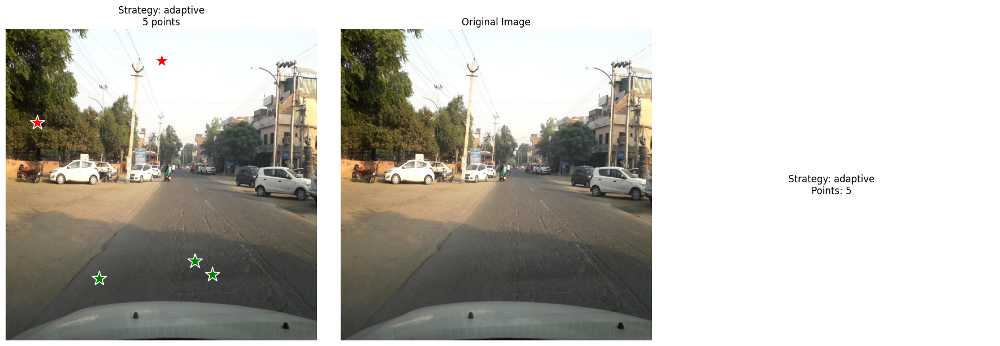

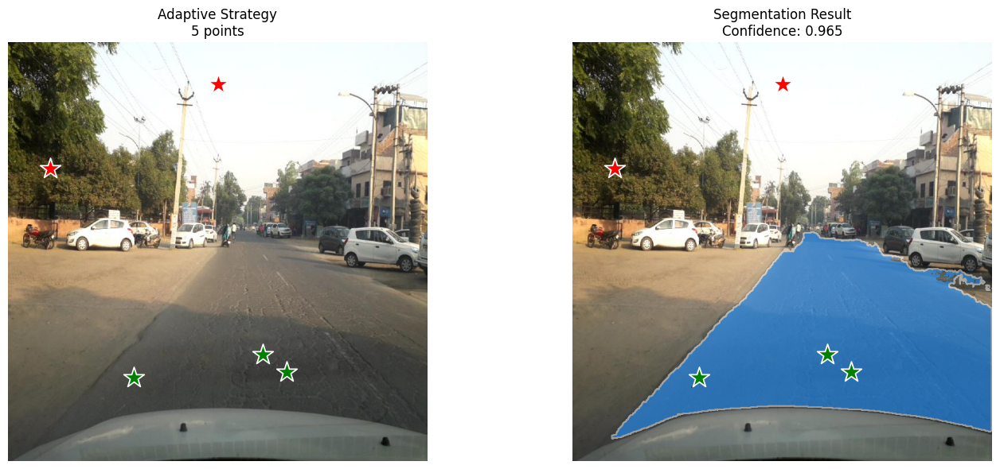

✓ adaptive strategy completed successfully
  Confidence: 0.965
  Mask area: 132,410.0 pixels
  Points used: 5

--------------------------------------------------
Testing Strategy: GRID
--------------------------------------------------


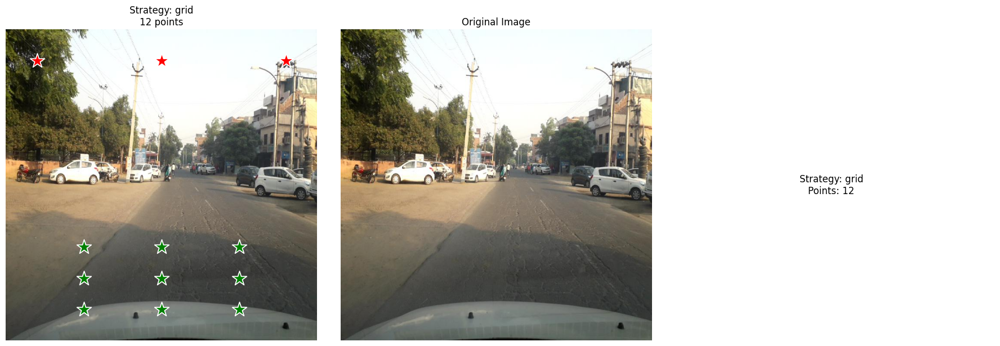

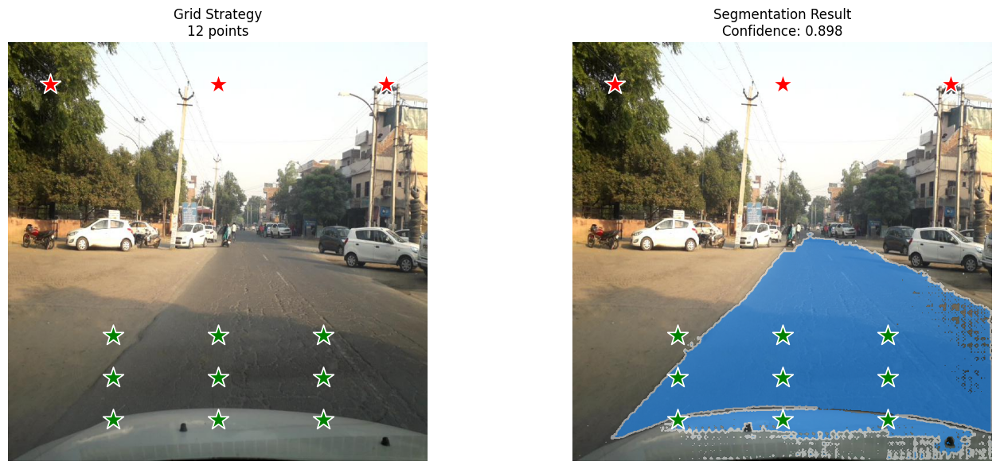

✓ grid strategy completed successfully
  Confidence: 0.898
  Mask area: 149,299.0 pixels
  Points used: 12

--------------------------------------------------
Testing Strategy: EDGE_BASED
--------------------------------------------------


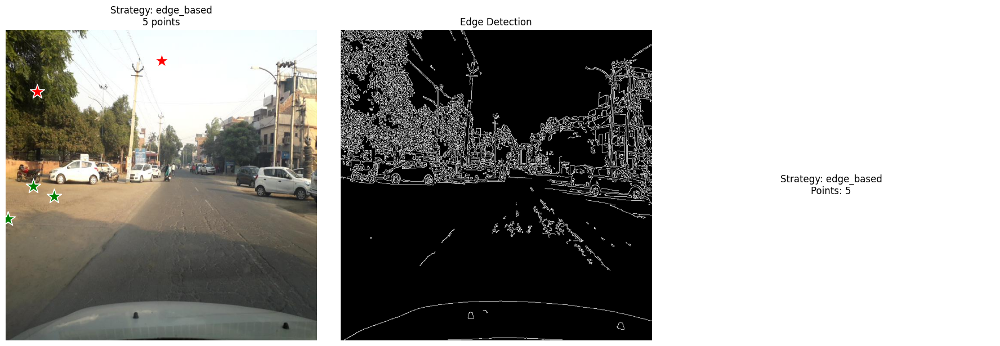

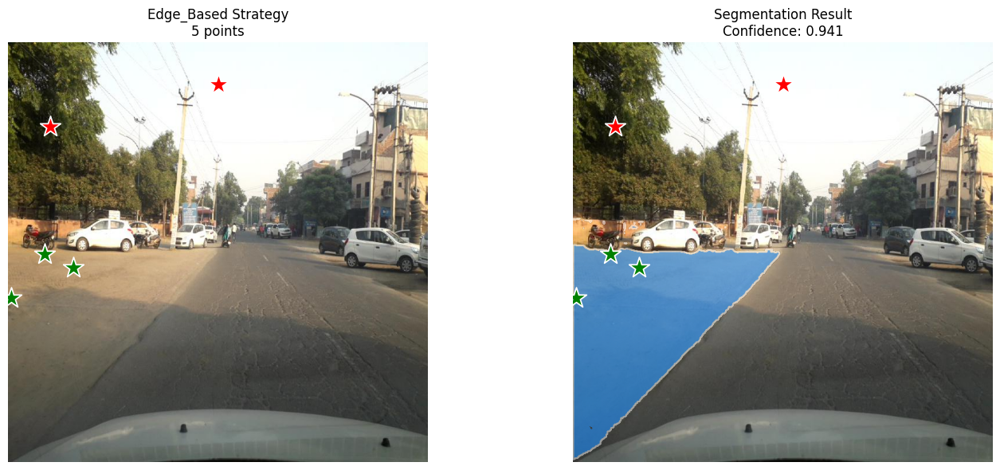

✓ edge_based strategy completed successfully
  Confidence: 0.941
  Mask area: 68,733.0 pixels
  Points used: 5

--------------------------------------------------
Testing Strategy: GRADIENT_BASED
--------------------------------------------------


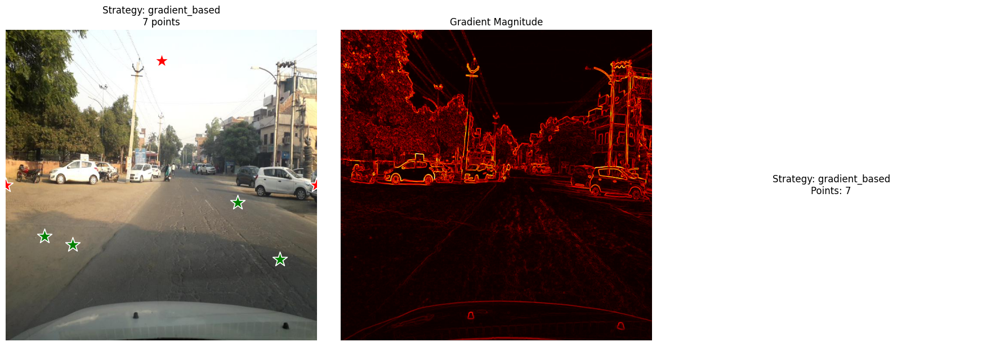

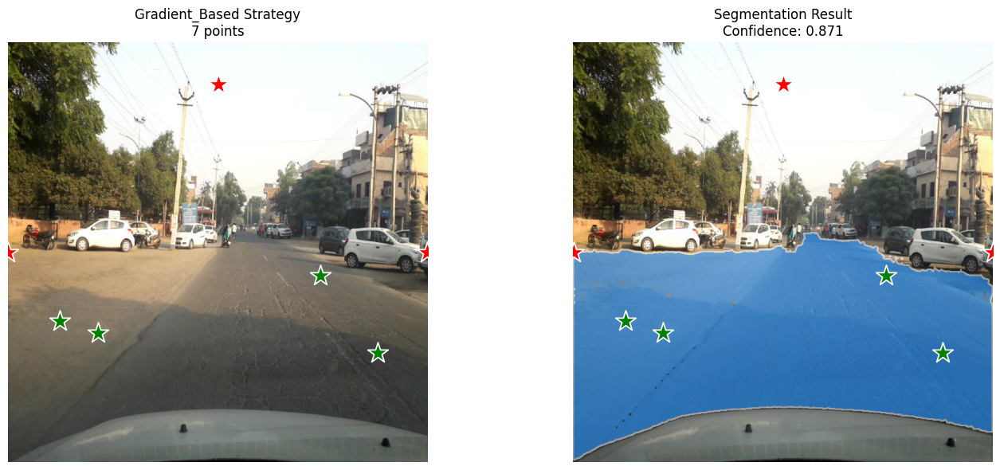

✓ gradient_based strategy completed successfully
  Confidence: 0.871
  Mask area: 205,070.0 pixels
  Points used: 7

STRATEGY PERFORMANCE SUMMARY
Strategy        Confidence   Mask Area    Points   Status
----------------------------------------------------------------------
adaptive        0.965        132,410.0    5        ✓
grid            0.898        149,299.0    12       ✓
edge_based      0.941        68,733.0     5        ✓
gradient_based  0.871        205,070.0    7        ✓

🏆 Best performing strategy: ADAPTIVE
   Confidence: 0.965
   Mask area: 132,410.0 pixels

Recommendations:
• Use 'adaptive' strategy for images similar to this one
• 'adaptive' strategy provides good balance of accuracy and efficiency
• 'grid' strategy is most reliable for consistent coverage
• 'edge_based' works well for images with clear road boundaries
• 'gradient_based' excels with smooth, uniform road surfaces


In [10]:
# Comprehensive Strategy Comparison
print("COMPREHENSIVE ROAD SEGMENTATION STRATEGY COMPARISON")
print("=" * 70)

# Select one representative image for detailed analysis
test_sample = random.choice(samples_with_bboxes)
print(f"Test Image: {os.path.basename(test_sample['image_path'])}")
print(f"Country: {test_sample['country']}")
print(f"Damage instances: {len(test_sample['bboxes'])}")

strategies = ['adaptive', 'grid', 'edge_based', 'gradient_based']
strategy_results = {}

print(f"\nTesting {len(strategies)} different segmentation strategies...")

for strategy in strategies:
    print(f"\n{'-'*50}")
    print(f"Testing Strategy: {strategy.upper()}")
    print('-'*50)
    
    try:
        # Run segmentation with current strategy
        image, masks, scores, points, labels = advanced_road_segmentation(
            test_sample['image_path'], 
            predictor, 
            strategy=strategy,
            visualize_analysis=True
        )
        
        # Store results
        strategy_results[strategy] = {
            'confidence': scores[0],
            'mask_area': np.sum(masks[0]),
            'n_points': len(points),
            'success': True
        }
        
        # Show segmentation result
        fig, axes = plt.subplots(1, 2, figsize=(15, 6))
        
        axes[0].imshow(image)
        show_points(points, labels, axes[0])
        axes[0].set_title(f"{strategy.title()} Strategy\n{len(points)} points")
        axes[0].axis('off')
        
        axes[1].imshow(image)
        show_mask(masks[0], axes[1], borders=True)
        show_points(points, labels, axes[1])
        axes[1].set_title(f"Segmentation Result\nConfidence: {scores[0]:.3f}")
        axes[1].axis('off')
        
        plt.tight_layout()
        plt.show()
        
        print(f"✓ {strategy} strategy completed successfully")
        print(f"  Confidence: {scores[0]:.3f}")
        print(f"  Mask area: {np.sum(masks[0]):,} pixels")
        print(f"  Points used: {len(points)}")
        
    except Exception as e:
        print(f"✗ Error with {strategy} strategy: {e}")
        strategy_results[strategy] = {
            'confidence': 0,
            'mask_area': 0,
            'n_points': 0,
            'success': False
        }

# Final comparison
print(f"\n{'='*70}")
print("STRATEGY PERFORMANCE SUMMARY")
print('='*70)

successful_strategies = [s for s in strategies if strategy_results[s]['success']]

if successful_strategies:
    print(f"{'Strategy':<15} {'Confidence':<12} {'Mask Area':<12} {'Points':<8} {'Status'}")
    print('-' * 70)
    
    for strategy in strategies:
        result = strategy_results[strategy]
        status = "✓" if result['success'] else "✗"
        print(f"{strategy:<15} {result['confidence']:<12.3f} {result['mask_area']:<12,} {result['n_points']:<8} {status}")
    
    # Find best strategy
    best_strategy = max(successful_strategies, 
                       key=lambda s: strategy_results[s]['confidence'])
    
    print(f"\n🏆 Best performing strategy: {best_strategy.upper()}")
    print(f"   Confidence: {strategy_results[best_strategy]['confidence']:.3f}")
    print(f"   Mask area: {strategy_results[best_strategy]['mask_area']:,} pixels")
    
    print(f"\nRecommendations:")
    print(f"• Use '{best_strategy}' strategy for images similar to this one")
    print(f"• 'adaptive' strategy provides good balance of accuracy and efficiency")
    print(f"• 'grid' strategy is most reliable for consistent coverage")
    print(f"• 'edge_based' works well for images with clear road boundaries")
    print(f"• 'gradient_based' excels with smooth, uniform road surfaces")
else:
    print("❌ All strategies failed - check image format and model setup")